# Dataset Creation

In [35]:
import torch
from torch.utils.data import Dataset
import json
import os
import numpy as np
from tqdm import tqdm

In [36]:
class ImageCaptionDataset(Dataset):
    def __init__(self, image_list_file, caption_file, vocab_file, feature_dir, max_len=20):
        with open(image_list_file, 'r') as f:
            self.image_names = json.load(f)

        with open(caption_file, 'r') as f:
            self.encoded_captions = json.load(f)

        with open(vocab_file, 'r') as f:
            vocab_data = json.load(f)
            self.word2idx = vocab_data['word2idx']
            self.idx2word = vocab_data['idx2word']
            self.vocab_size = len(self.word2idx)

        self.feature_dir = feature_dir
        self.max_len = max_len

    def __len__(self):
        return len(self.image_names)

    def __getitem__(self, idx):
        img_name = self.image_names[idx]
        feature_path = os.path.join(self.feature_dir, img_name.replace('.jpg', '.npy'))
        image_feature = np.load(feature_path)

        captions = self.encoded_captions[img_name]
        caption = torch.tensor(captions[np.random.randint(0, len(captions))], dtype=torch.long)

        image_feature = torch.tensor(image_feature, dtype=torch.float32)

        return image_feature, caption

In [37]:
from torch.utils.data import DataLoader

train_dataset = ImageCaptionDataset(
    image_list_file='../data/flickr_train_images.json',
    caption_file='../data/flickr_encoded_captions.json',
    vocab_file='../data/flickr_vocab.json',
    feature_dir='../features/',
    max_len=20
)

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True, drop_last=True)


In [4]:
train_dataset[0]

(tensor([0.0000, 0.0000, 0.0000,  ..., 0.1234, 0.0050, 0.0000]),
 tensor([  12, 2807,  752, 2154, 2682,   13, 1505, 1511,  285, 1702, 2892,   11,
            0,    0,    0,    0,    0,    0,    0,    0]))

In [5]:
idx2word = train_dataset.idx2word
caption_words = [idx2word[str(idx.item())] for idx in train_dataset[0][1]]
print("Decoded Caption:", ' '.join(caption_words))


Decoded Caption: <start> a black dog is running after a white dog in the snow <end> <pad> <pad> <pad> <pad> <pad> <pad>


In [6]:
train_loader

In [7]:
for features, captions in train_loader:
    print("Batch Image Features:", features.shape)  # [4, 2048]
    print("Batch Captions:", captions.shape)        # [4, 20]
    break

Batch Image Features: torch.Size([32, 2048])
Batch Captions: torch.Size([32, 20])


# LSTM Decoder

In [8]:
import torch
import torch.nn as nn
import torch.nn.functional as F

In [9]:
class DecoderRNN(nn.Module):
    def __init__(self, embed_size, hidden_size, vocab_size, num_layers=1):
        super(DecoderRNN, self).__init__()
        
        self.embed = nn.Embedding(vocab_size, embed_size, padding_idx=0)
        self.init_fc = nn.Linear(2048, embed_size) 
        self.lstm = nn.LSTM(embed_size, hidden_size, num_layers, batch_first=True)
        self.linear = nn.Linear(hidden_size, vocab_size)
        
    def forward(self, image_features, captions):
        captions = torch.clamp(captions, min=0, max=self.embed.num_embeddings - 1)
        embeddings = self.embed(captions[:, :-1]) 
        img_embed = self.init_fc(image_features).unsqueeze(1)  
        lstm_input = torch.cat((img_embed, embeddings), dim=1)  
        lstm_out, _ = self.lstm(lstm_input)
        outputs = self.linear(lstm_out)  
        return outputs

In [10]:
vocab_size = train_dataset.vocab_size
embed_size = 512
hidden_size = 1024

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = DecoderRNN(embed_size, hidden_size, vocab_size).to(device)

In [11]:
criterion = nn.CrossEntropyLoss(ignore_index=0)
optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)

In [12]:
num_epochs = 30
train_losses=[]
for epoch in range(num_epochs):
    model.train()
    total_loss = 0
    loop = tqdm(train_loader, desc=f"Epoch {epoch+1}/{num_epochs}", leave=False)
    
    for batch_idx, (features, captions) in enumerate(loop):
        features, captions = features.to(device), captions.to(device)
        
        outputs = model(features, captions)
        
        targets = captions[:, 1:]  # Remove first token
        outputs = outputs[:, :-1, :]  # Remove last output
        
        loss = criterion(outputs.reshape(-1, vocab_size), targets.reshape(-1))
        
        optimizer.zero_grad()
        loss.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=5.0)
        optimizer.step()
        
        total_loss += loss.item()
        loop.set_postfix(loss=loss.item())
    
    avg_loss = total_loss / len(train_loader)
    print(f"Epoch {epoch+1} - Avg Loss: {avg_loss:.4f}")
    train_losses.append(avg_loss)
    
    if (epoch+1) % 2 == 0:
        model.eval()
        with torch.no_grad():
            sample_outputs = outputs[0].argmax(dim=1).tolist()
            sample_caption = []
            for i in sample_outputs:
                if str(i) in train_dataset.idx2word:
                    word = train_dataset.idx2word[str(i)]
                    if word not in ['<pad>']:
                        sample_caption.append(word)
            print("Sample Prediction:", ' '.join(sample_caption))
        model.train()

print("Training completed!")

Epoch 1 - Avg Loss: 4.6176


Epoch 2 - Avg Loss: 4.0658
Sample Prediction: a dog dog is a a a a a a a a <end> <end> <end> <end> <end> <end> <end>


Epoch 3 - Avg Loss: 3.8289


Epoch 4 - Avg Loss: 3.6495
Sample Prediction: a dog dog a a in the the <unk> through water <end> <end> <end> <end> <end> <end> <end> <end>


Epoch 5 - Avg Loss: 3.5273


Epoch 6 - Avg Loss: 3.4178
Sample Prediction: a man in a a a <unk> a a a <end> <end> <end> <end> <end> <end> <end> <end> <end>


Epoch 7 - Avg Loss: 3.2943


Epoch 8 - Avg Loss: 3.1965
Sample Prediction: a man in a hair and his guitar a <end> <end> <end> a <unk> <end> <end> <end> <end> <end>


Epoch 9 - Avg Loss: 3.0898


Epoch 10 - Avg Loss: 2.9998
Sample Prediction: a little boy a red shirt is dress is down climb a wall <end> a a <end> <end> <end>


Epoch 11 - Avg Loss: 2.9062


Epoch 12 - Avg Loss: 2.8155
Sample Prediction: a people are playing and the <unk> are the on the <end> <end> on the them them <end> <end>


Epoch 13 - Avg Loss: 2.7525


Epoch 14 - Avg Loss: 2.6595
Sample Prediction: a man a riding bikes bikes bikes on a road <end> a background background background background background background background


Epoch 15 - Avg Loss: 2.5711


Epoch 16 - Avg Loss: 2.4731
Sample Prediction: a person a man kayak a boat boat the <unk> flag over sail <end> the the water <end> the


Epoch 17 - Avg Loss: 2.3967


Epoch 18 - Avg Loss: 2.3099
Sample Prediction: a boy boy a red shirt is on a a courtyard <end> <end> <end> <end> trees her her <end>


Epoch 19 - Avg Loss: 2.2801


Epoch 20 - Avg Loss: 2.1616
Sample Prediction: a man in a a shallow <end> the <end> fishing <end> <end> the watch watches <end> <end> <end> him


Epoch 21 - Avg Loss: 2.1180


Epoch 22 - Avg Loss: 2.0527
Sample Prediction: a man is leaping the air <end> a <unk> <end> her <end> <end> <end> <end> <end> <end> <end> <end>


Epoch 23 - Avg Loss: 1.9759


Epoch 24 - Avg Loss: 1.9062
Sample Prediction: two people in a side looking seen from behind <end> <end> <end> <end> <end> <end> <end> <end> <end> <end>


Epoch 25 - Avg Loss: 1.8453


Epoch 26 - Avg Loss: 1.7897
Sample Prediction: a people people ice cream place decorated with giant cone two <unk> <end> <end> <end> <end> them them them


Epoch 27 - Avg Loss: 1.7556


Epoch 28 - Avg Loss: 1.6854
Sample Prediction: three people on reflective vests are riding bikes in the city <end> night <end> a a buildings a a


Epoch 29 - Avg Loss: 1.6478


Epoch 30 - Avg Loss: 1.6099
Sample Prediction: two children girls on with tire in in three are wearing blue shirts of the same shade and blue
Training completed!


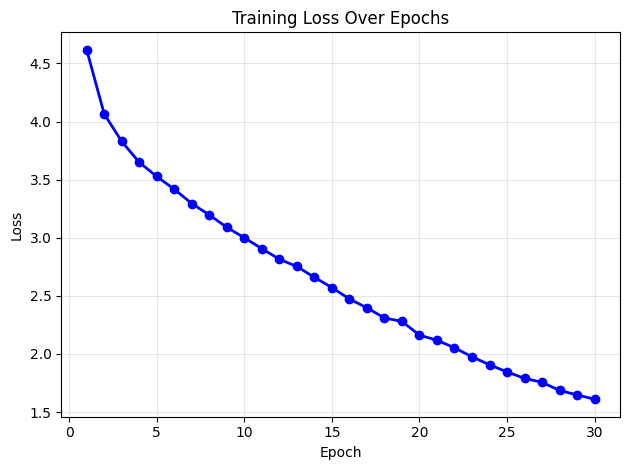

Total Loss Reduction: 3.0078


In [13]:
import matplotlib.pyplot as plt

epochs = list(range(1, num_epochs+1))

plt.figure()

plt.plot(epochs, train_losses, 'b-', marker='o', linewidth=2)
plt.title('Training Loss Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

print(f"Total Loss Reduction: {train_losses[0] - train_losses[-1]:.4f}")

# Model Evaluation

In [15]:
def generate_caption(model, image_feature, dataset, max_length=20):
    model.eval()
    with torch.no_grad():
        start_token = dataset.word2idx.get('<start>', 1)
        current_token = torch.tensor([[start_token]], device=device)
        
        img_embed = model.init_fc(image_feature.unsqueeze(0).to(device)).unsqueeze(1)
        hidden = None
        caption = []
        
        for _ in range(max_length):
            if len(caption) == 0:
                lstm_input = img_embed
            else:
                token_embed = model.embed(current_token)
                lstm_input = token_embed

            lstm_out, hidden = model.lstm(lstm_input, hidden)
            outputs = model.linear(lstm_out)
            next_token = outputs.argmax(dim=2).item()

            word = dataset.idx2word.get(str(next_token), '<unk>')
            if word in ['<end>', '<pad>']:
                break
            caption.append(word)
            current_token = torch.tensor([[next_token]], device=device)
        
    return ' '.join(caption)


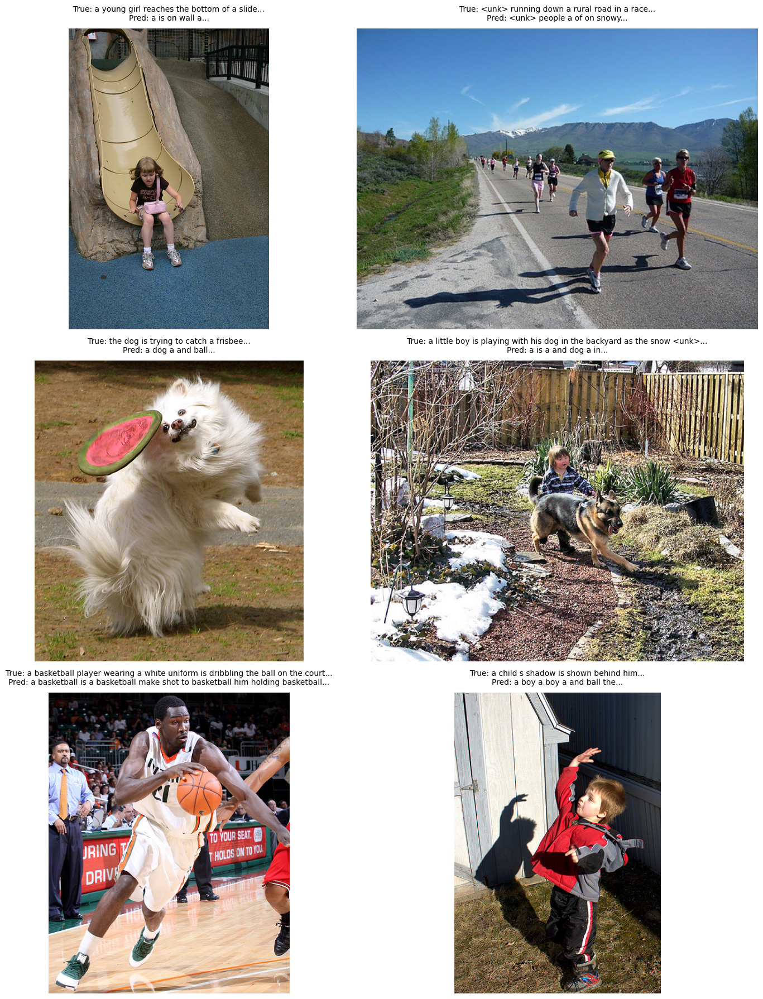

In [16]:
from PIL import Image
import random

def decode_caption(encoded, idx2word):
    words = [idx2word.get(str(idx), '<unk>') for idx in encoded]
    return ' '.join([w for w in words if w not in ['<pad>', '<start>', '<end>']])

fig, axes = plt.subplots(3, 2, figsize=(15, 18))
axes = axes.flatten()

for i in range(6):
    idx = random.randint(0, len(train_dataset) - 1)
    image_feature, caption_encoded = train_dataset[idx]
    image_name = train_dataset.image_names[idx]

    try:
        image_path = f'../data/Flickr8k_Dataset/Flicker8k_Dataset/{image_name}'
        img = Image.open(image_path).convert("RGB")
        axes[i].imshow(img)
        axes[i].axis('off')
    except:
        axes[i].text(0.5, 0.5, f'Image:\n{image_name}', ha='center', va='center',
                     transform=axes[i].transAxes, fontsize=12, bbox=dict(boxstyle="round", facecolor='lightgray'))
        axes[i].axis('off')

    true_caption = decode_caption(caption_encoded.tolist(), train_dataset.idx2word)
    pred_caption = generate_caption(model, image_feature.to(device), train_dataset)
    
    axes[i].set_title(f"True: {true_caption}...\nPred: {pred_caption}...", fontsize=10, pad=10)

plt.tight_layout()
plt.show()


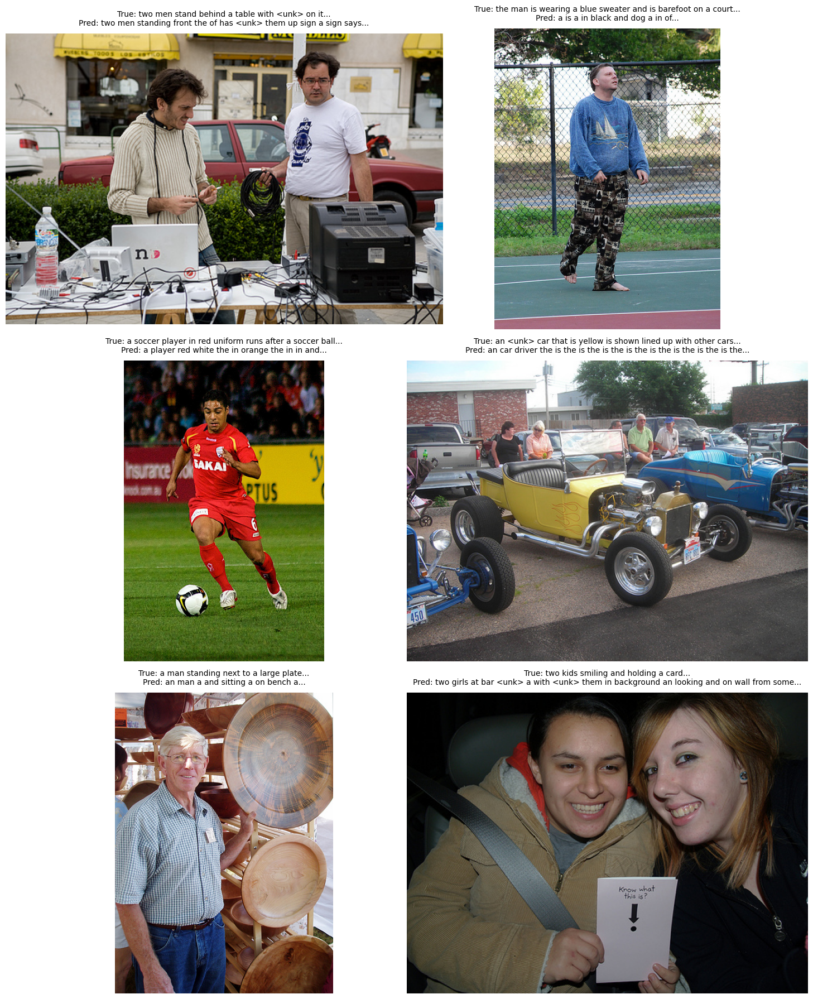

In [17]:
def generate_caption_beam_search(model, image_feature, dataset, beam_size=3, max_length=20):
    model.eval()
    start_token = dataset.word2idx.get('<start>', 1)
    end_token = dataset.word2idx.get('<end>', 2)

    with torch.no_grad():
        img_embed = model.init_fc(image_feature.unsqueeze(0).to(device)).unsqueeze(1)
        hidden = None

        sequences = [[[], 0.0, hidden, img_embed]]  # (tokens, score, hidden_state, lstm_input)

        for _ in range(max_length):
            all_candidates = []
            for seq, score, hidden, lstm_input in sequences:
                if len(seq) > 0 and seq[-1] == end_token:
                    all_candidates.append((seq, score, hidden, lstm_input))
                    continue

                lstm_out, hidden_new = model.lstm(lstm_input, hidden)
                output = model.linear(lstm_out.squeeze(1))
                probs = torch.nn.functional.log_softmax(output, dim=1)
                topk_probs, topk_indices = probs.topk(beam_size)

                for i in range(beam_size):
                    token = topk_indices[0][i].item()
                    token_score = topk_probs[0][i].item()
                    new_seq = seq + [token]
                    alpha = 0.7
                    length_penalty = ((5 + len(seq)) / 6) ** alpha
                    new_score = (score + token_score) / length_penalty
                    next_input = model.embed(torch.tensor([[token]], device=device))
                    all_candidates.append((new_seq, new_score, hidden_new, next_input))

            ordered = sorted(all_candidates, key=lambda tup: tup[1], reverse=True)
            sequences = ordered[:beam_size]

        best_seq = sequences[0][0]
        caption = [dataset.idx2word.get(str(idx), '<unk>') for idx in best_seq]
        caption = [word for word in caption if word not in ['<start>', '<end>', '<pad>']]
        return ' '.join(caption)

fig, axes = plt.subplots(3, 2, figsize=(15, 18))
axes = axes.flatten()

for i in range(6):
    idx = random.randint(0, len(train_dataset) - 1)
    image_feature, caption_encoded = train_dataset[idx]
    image_name = train_dataset.image_names[idx]

    try:
        image_path = f'../data/Flickr8k_Dataset/Flicker8k_Dataset/{image_name}'
        img = Image.open(image_path).convert("RGB")
        axes[i].imshow(img)
        axes[i].axis('off')
    except:
        axes[i].text(0.5, 0.5, f'Image:\n{image_name}', ha='center', va='center',
                     transform=axes[i].transAxes, fontsize=12, bbox=dict(boxstyle="round", facecolor='lightgray'))
        axes[i].axis('off')

    true_caption = decode_caption(caption_encoded.tolist(), train_dataset.idx2word)
    pred_caption = generate_caption_beam_search(model, image_feature.to(device), train_dataset, beam_size=5)
    
    axes[i].set_title(f"True: {true_caption}...\nPred: {pred_caption}...", fontsize=10, pad=10)

plt.tight_layout()
plt.show()


In [18]:
from torchvision.models import resnet50, ResNet50_Weights
import torchvision.transforms as transforms

weights = ResNet50_Weights.DEFAULT
resnet = resnet50(weights=weights)
resnet = torch.nn.Sequential(*list(resnet.children())[:-1])  # Remove final FC layer
resnet.eval()
resnet.to(device)

transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

class RawImageCaptionTestDataset(Dataset):
    def __init__(self, image_list_file, caption_file, vocab_file, image_dir, max_len=20):
        with open(image_list_file, 'r') as f:
            self.image_names = json.load(f)

        with open(caption_file, 'r') as f:
            self.encoded_captions = json.load(f)

        with open(vocab_file, 'r') as f:
            vocab = json.load(f)
            self.word2idx = vocab['word2idx']
            self.idx2word = vocab['idx2word']

        self.image_dir = image_dir
        self.max_len = max_len

    def __len__(self):
        return len(self.image_names)

    def __getitem__(self, idx):
        img_name = self.image_names[idx]
        img_path = os.path.join(self.image_dir, img_name)

        image = Image.open(img_path).convert('RGB')
        image_tensor = transform(image).to(device)

        captions = self.encoded_captions[img_name]
        caption = torch.tensor(captions[np.random.randint(0, len(captions))], dtype=torch.long)

        return image_tensor, caption, img_name

def generate_caption_from_image(model, image_tensor, dataset, max_length=20):
    model.eval()
    with torch.no_grad():
        image_tensor = image_tensor.unsqueeze(0).to(device)  
        image_feature = resnet(image_tensor).squeeze()  
        
        start_token = dataset.word2idx.get('<start>', 1)
        current_token = torch.tensor([[start_token]], device=device)
        
        img_embed = model.init_fc(image_feature.unsqueeze(0)).unsqueeze(1)  # [1, 1, embed_size]
        hidden = None
        caption = []
        
        for _ in range(max_length):
            if len(caption) == 0:
                lstm_input = img_embed
            else:
                token_embed = model.embed(current_token)
                lstm_input = token_embed

            lstm_out, hidden = model.lstm(lstm_input, hidden)
            outputs = model.linear(lstm_out)
            next_token = outputs.argmax(dim=2).item()

            word = dataset.idx2word.get(str(next_token), '<unk>')
            if word in ['<end>', '<pad>']:
                break
            caption.append(word)
            current_token = torch.tensor([[next_token]], device=device)
        
    return ' '.join(caption)

test_dataset = RawImageCaptionTestDataset(
    image_list_file='../data/flickr_test_images.json',
    caption_file='../data/flickr_encoded_captions.json',
    vocab_file='../data/flickr_vocab.json',
    image_dir='../data/Flickr8k_Dataset/Flicker8k_Dataset'
)


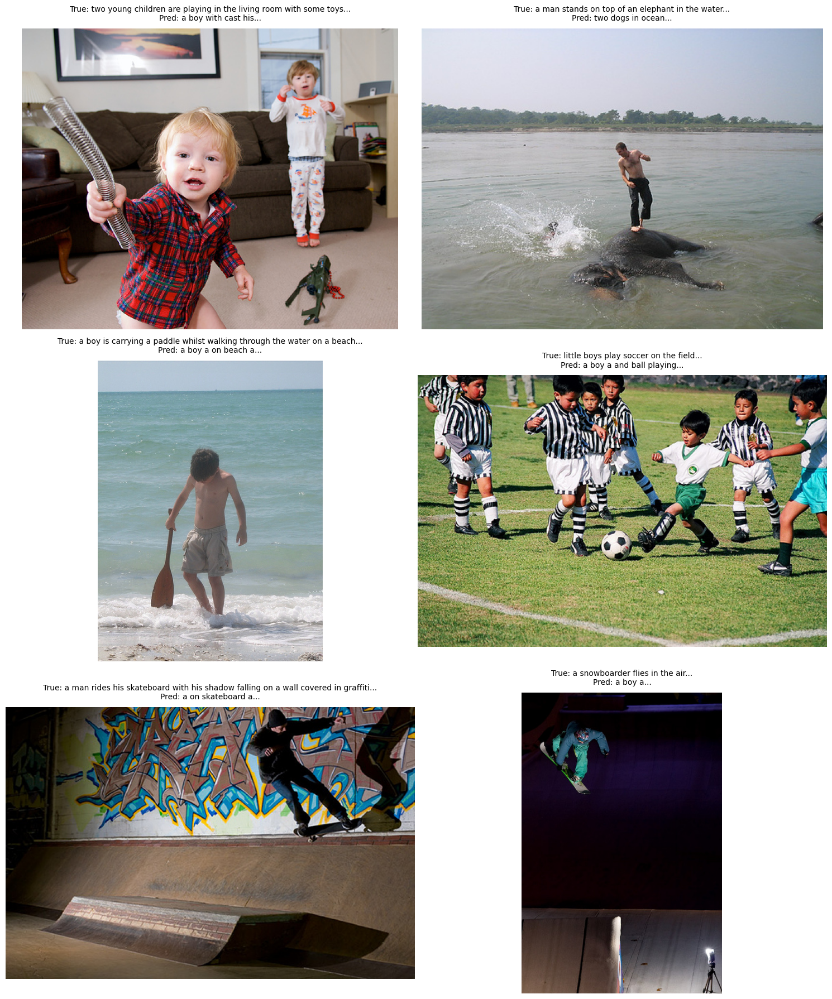

In [19]:
fig, axes = plt.subplots(3, 2, figsize=(15, 18))
axes = axes.flatten()

for i in range(6):
    idx = random.randint(0, len(test_dataset) - 1)
    image_tensor, caption_encoded, image_name = test_dataset[idx]
    
    try:
        image_path = os.path.join(test_dataset.image_dir, image_name)
        img = Image.open(image_path).convert("RGB")
        axes[i].imshow(img)
        axes[i].axis('off')
    except:
        axes[i].text(0.5, 0.5, f'Image:\n{image_name}', ha='center', va='center',
                     transform=axes[i].transAxes, fontsize=12, 
                     bbox=dict(boxstyle="round", facecolor='lightgray'))
        axes[i].axis('off')
    
    true_caption = decode_caption(caption_encoded.tolist(), test_dataset.idx2word)
    pred_caption = generate_caption_from_image(model, image_tensor, test_dataset)
    
    axes[i].set_title(f"True: {true_caption}...\nPred: {pred_caption}...",
                      fontsize=10, pad=10)

plt.tight_layout()
plt.show()

In [20]:
import nltk
from nltk.translate.bleu_score import sentence_bleu, SmoothingFunction
from nltk.translate.meteor_score import meteor_score

nltk.download('wordnet')
nltk.download('omw-1.4')

smoothie = SmoothingFunction().method4


[nltk_data] Downloading package wordnet to
[nltk_data]     <local_path>
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package omw-1.4 to
[nltk_data]     <local_path>
[nltk_data]   Package omw-1.4 is already up-to-date!


In [21]:
def evaluate_caption_metrics(model, dataset, num_samples=100):
    model.eval()
    
    bleu_scores = []
    meteor_scores = []
    
    num_samples = min(num_samples, len(dataset))
    
    with torch.no_grad():
        for i in tqdm(range(num_samples), desc="Evaluating"):
            if hasattr(dataset, 'image_dir'): 
                image_tensor, caption_encoded, image_name = dataset[i]
                generated_caption = generate_caption_from_image(model, image_tensor, dataset).lower()
                all_captions = dataset.encoded_captions[image_name]
                references = []
                for cap_encoded in all_captions:
                    cap_text = decode_caption(cap_encoded, dataset.idx2word).lower()
                    references.append(cap_text.split())
            else: 
                image_feature, caption_encoded = dataset[i]
                generated_caption = generate_caption_beam_search(model, image_feature, dataset).lower()
                ref_text = decode_caption(caption_encoded.tolist(), dataset.idx2word).lower()
                references = [ref_text.split()]
            
            hypothesis = generated_caption.split()
            
            if len(hypothesis) > 0 and any(len(ref) > 0 for ref in references):
                bleu = sentence_bleu(references, hypothesis, smoothing_function=smoothie)
                bleu_scores.append(bleu)
                
                meteor = meteor_score(references, hypothesis)
                meteor_scores.append(meteor)
    
    avg_bleu = np.mean(bleu_scores) if bleu_scores else 0
    avg_meteor = np.mean(meteor_scores) if meteor_scores else 0
    
    print(f"Average BLEU Score: {avg_bleu:.4f}")
    print(f"Average METEOR Score: {avg_meteor:.4f}")
    

In [22]:
evaluate_caption_metrics(model, train_dataset, num_samples=100)

Evaluating: 100%|████████████████████████████████████████████████████████████████████| 100/100 [00:15<00:00,  6.28it/s]

Average BLEU Score: 0.0273
Average METEOR Score: 0.1539


In [23]:
evaluate_caption_metrics(model, test_dataset, num_samples=100)

Evaluating: 100%|████████████████████████████████████████████████████████████████████| 100/100 [00:15<00:00,  6.65it/s]

Average BLEU Score: 0.0585
Average METEOR Score: 0.1891
